In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_absolute_error

In [2]:
df_FR = pd.read_csv('EPEX_FR.csv')

In [3]:
df_FR['Date'] = pd.to_datetime(df_FR['Date'])
df_FR = df_FR.set_index('Date')

In [4]:
def smape(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))) * 100

### Missing values :

In [5]:
# Number of missing values (EPEX-BE) :
print("Price : ", df_FR['Price'].isna().sum())
print("Exogenous 1 : ", df_FR['Load forecast'].isna().sum())
print("Exogenous 2 : ", df_FR['Generation forecast'].isna().sum())

Price :  0
Exogenous 1 :  0
Exogenous 2 :  192


<AxesSubplot: xlabel='Date'>

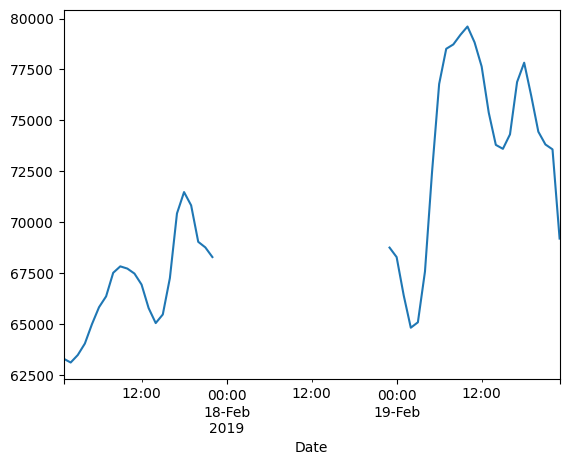

In [6]:
## Before linear interpolation
df_FR.loc[(df_FR.index < '2019-02-20') & (df_FR.index > '2019-02-17'), 'Generation forecast'].plot()

In [7]:
## Linear interpolation
df_FR = df_FR.interpolate('linear')

<AxesSubplot: xlabel='Date'>

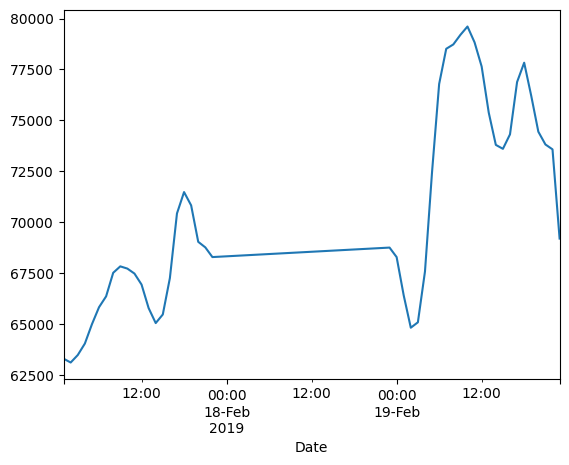

In [8]:
## After linear interpolation
df_FR.loc[(df_FR.index < '2019-02-20') & (df_FR.index > '2019-02-17'), 'Generation forecast'].plot()

In [9]:
# Number of missing values (EPEX-FR) :
print("Price : ", df_FR['Price'].isna().sum())
print("Exogenous 1 : ", df_FR['Load forecast'].isna().sum())
print("Exogenous 2 : ", df_FR['Generation forecast'].isna().sum())

Price :  0
Exogenous 1 :  0
Exogenous 2 :  0


### The EPEX-FR market :

In [10]:
print(df_FR)

                           Load forecast  Generation forecast  Price
Date                                                                
2017-01-01 00:00:00+00:00        73650.0              69539.0  58.23
2017-01-01 01:00:00+00:00        72350.0              67376.0  51.95
2017-01-01 02:00:00+00:00        68750.0              65412.0  47.27
2017-01-01 03:00:00+00:00        65900.0              64557.0  45.49
2017-01-01 04:00:00+00:00        65000.0              64552.0  44.50
...                                  ...                  ...    ...
2022-12-31 19:00:00+00:00        46950.0              44648.0   7.60
2022-12-31 20:00:00+00:00        44350.0              43841.0   3.69
2022-12-31 21:00:00+00:00        43950.0              44578.0   1.88
2022-12-31 22:00:00+00:00        47250.0              45135.0   0.10
2022-12-31 23:00:00+00:00        46050.0              42280.0   0.00

[52584 rows x 3 columns]


In [11]:
FR_load = df_FR['Load forecast']
FR_generation = df_FR['Generation forecast']
FR_price = df_FR['Price']

In [12]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_FR.index,
                         y=FR_load,
                         mode='lines',
                         name="Load forecast",
                         line=dict(color='#4A41D3')))

fig.add_trace(go.Scatter(x=df_FR.index,
                         y=FR_generation,
                         mode='lines',
                         name="Generation forecast",
                         line=dict(color='#D36941')))

fig.add_trace(go.Scatter(x=df_FR.index,
                         y=FR_price,
                         mode='lines',
                         name="Price",
                         line=dict(color='#299B1E')))

fig.update_xaxes(title="Date", 
                 title_font=dict(size=20, family='Open Sans', color='#AD2C30'), 
                 rangeslider_visible=True)

fig.update_layout(height=650,
                  title="EPEX-FR market (2017-2022)",
                  title_x=0.5,
                  title_font_family="Times New Roman",
                  title_font_size=22,
                  title_font_color="darkred",
                  font=dict(size=14, color="RebeccaPurple"),
                  legend=dict(yanchor="top", y=0.3, xanchor="left", x=1.02),
                  margin={"t": 40, "b": 20, "l": 0, "r": 0})

fig.show()

In [13]:
ADF_FR = adfuller(FR_price)

print('ADF Statistic: %f' % ADF_FR[0])
print('p-value: %f' % ADF_FR[1])
if (ADF_FR[1] <= 0.05) & (ADF_FR[4]['5%'] > ADF_FR[0]):
    print("\u001b[32mThe series 'FR_price' is stationary\u001b[0m")
else:
    print("\x1b[31mThe series 'FR_price' is not stationary\x1b[0m")

ADF Statistic: -5.427870
p-value: 0.000003
The series 'FR_price' is stationary


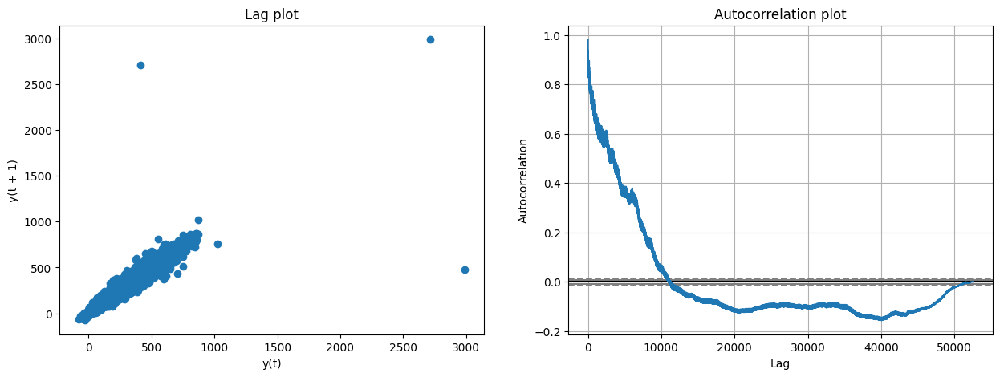

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

pd.plotting.lag_plot(FR_price, ax=axes[0])
axes[0].set_title('Lag plot')

pd.plotting.autocorrelation_plot(FR_price, ax=axes[1])
axes[1].set_title('Autocorrelation plot')

plt.show()

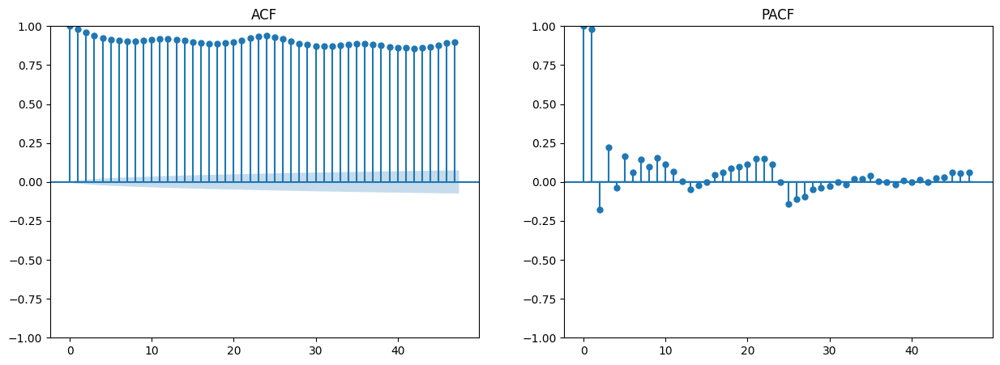

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

plot_acf(FR_price, lags=range(0,48), ax=axes[0])
axes[0].set_title('ACF')

plot_pacf(FR_price, lags=range(0,48), method='ywm', ax=axes[1])
axes[1].set_title('PACF')

plt.show()

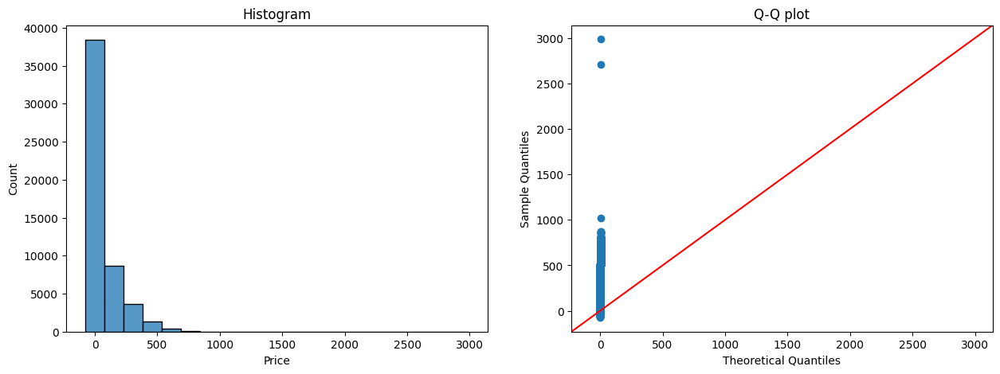

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

sns.histplot(ax=axes[0], data=FR_price, bins=20)
axes[0].set_title('Histogram')

sm.qqplot(FR_price, line='45', ax=axes[1])
axes[1].set_title('Q-Q plot')

plt.show()

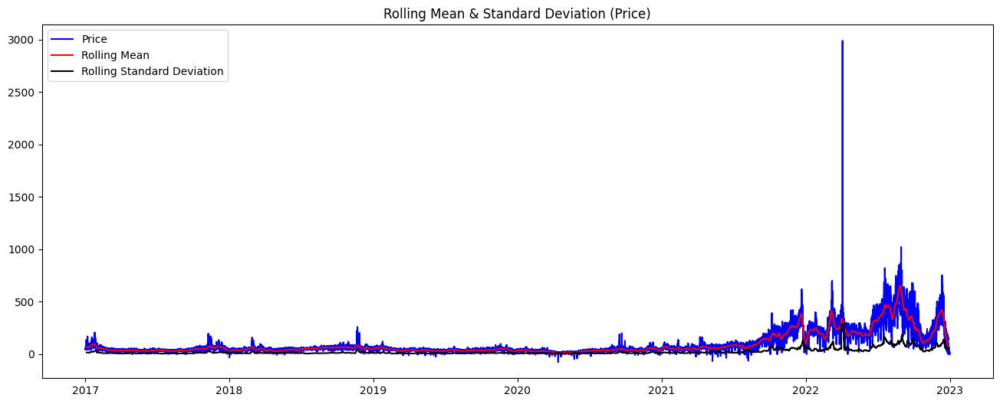

In [17]:
rolmean = FR_price.rolling(window=168, center=True).mean()
rolstd = FR_price.rolling(window=168, center=True).std()

plt.figure(figsize=(16, 6))

plt.plot(FR_price, color='blue',label='Price')
plt.plot(rolmean, color='red', label='Rolling Mean')
plt.plot(rolstd, color='black', label = 'Rolling Standard Deviation')

plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation (Price)')
plt.show()

##### ARIMA model :

We will use the ARIMAX model. The name ARIMAX comes as an extension of ARIMA. The X added to the end stands for “exogenous”. In other words, it suggests adding some separate outside variables to help measure our endogenous variable.

The ARIMA model acronym stands for <i>“Auto-Regressive Integrated Moving Average”</i> :

● <i>Autoregressive Component — AR(p) :</i>

The autoregressive component of the ARIMA model is represented by AR(p), with the p parameter determining the number of lagged series that we use.

<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/a1cf2528b970cd7805145fb9edaf6c9561fab452" width = 500 />

If we set the p parameter as zero (AR(0)), with no autoregressive terms. This time series is just white noise. Each data point is sampled from a distribution with a mean of 0 and a variance of sigma-squared. This results in a sequence of random numbers that can’t be predicted. With the p parameter set to 1, we are taking into account the previous timestamp adjusted by a multiplier, and then adding white noise. If the multiplier is 0 then we get white noise, and if the multiplier is 1 we get a random walk. If the multiplier is between $0 < α_1 < 1$, then the time series will exhibit mean reversion. This means that the values tend to hover around 0 and revert to the mean after regressing from it.

● <i>Moving Average — MA(q) :</i>

<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/e66f77db73db6073043236e139bd508b23a2b95f" width = 500 />

MA(q) is the moving average model and q is the number of lagged forecasting error terms in the prediction. In a MA(1) model, our forecast is a constant term plus the previous white noise term times a multiplier, added with the current white noise term.

● <i>ARMA and ARIMA :</i>

ARMA is just the AR (Autoregressive) and MA (Moving Average) components put together. The ARIMA model is an ARMA model yet with a preprocessing step included in the model that we represent using I(d). I(d) is the difference order, which is the number of transformations needed to make the data stationary. So, an ARIMA model is simply an ARMA model on the differenced time series.

The auto-ARIMA process seeks to identify the most optimal parameters for an ARIMA model, settling on a single fitted ARIMA model. Auto-ARIMA works by conducting differencing tests (i.e., Kwiatkowski–Phillips–Schmidt–Shin, Augmented Dickey-Fuller or Phillips–Perron) to determine the order of differencing, d, and then fitting models within ranges of defined start_p, max_p, start_q, max_q ranges. If the seasonal optional is enabled, auto-ARIMA also seeks to identify the optimal P and Q hyper- parameters after conducting the Canova-Hansen to determine the optimal order of seasonal differencing, D.

In order to find the best model, auto-ARIMA optimizes for a given information_criterion, one of (‘aic’, ‘aicc’, ‘bic’, ‘hqic’, ‘oob’) (Akaike Information Criterion, Corrected Akaike Information Criterion, Bayesian Information Criterion, Hannan-Quinn Information Criterion, or “out of bag”–for validation scoring–respectively) and returns the ARIMA which minimizes the value.

In [18]:
start_train = len(df_FR.loc[df_FR.index < '2019-01-01 00:00:00+00:00'])
start_test = len(df_FR.loc[df_FR.index < '2021-01-01 00:00:00+00:00'])
end_test = len(df_FR.loc[df_FR.index < '2022-06-30 00:00:00+00:00'])

In [19]:
FR_price_test = df_FR.loc[(df_FR.index >= '2021-01-01 00:00:00+00:00') & (df_FR.index < '2022-07-01 00:00:00+00:00') , 'Price']

In [20]:
predictions_FR_arima = pd.Series(dtype='float64')
MAE_FR_arima = []
SMAPE_FR_arima = []

for i in np.arange(0, end_test - start_test+1, 24):
    
    X_train = df_FR.iloc[start_train+i:start_test+i, [0,1]]
    y_train = df_FR.iloc[start_train+i:start_test+i, 2]
    
    model_arima_FR = auto_arima(y_train,
                            start_p = 1,
                            start_q = 1,
                            max_p = 3,
                            max_q = 3,
                            test = 'adf',
                            seasonal = False,
                            exogenous = X_train,
                            trace = False,
                            error_action = "ignore",
                            suppress_warnings = True)
    
    model_arima_FR.fit(y_train, exogenous=X_train)
    
    X_test = df_FR.iloc[start_test+i:start_test+i+24, [0,1]]
    y_test = df_FR.iloc[start_test+i:start_test+i+24, 2]
    
    forecast = model_arima_FR.predict(n_periods=len(y_test), exogenous=X_test)
    MAE = mean_absolute_error(y_test, forecast)
    SMAPE = smape(y_test, forecast)
    
    MAE_FR_arima.append(MAE)
    SMAPE_FR_arima.append(SMAPE)
    
    print(str(forecast.index[0].date())+" ➜ MAE = "+str(round(MAE,6))+" / SMAPE = "+str(round(SMAPE,6))+" %")
        
    predictions_FR_arima = pd.concat([predictions_FR_arima, forecast])

2021-01-01 ➜ MAE = 6.147156 / SMAPE = 12.597109 %
2021-01-02 ➜ MAE = 6.755248 / SMAPE = 13.515329 %
2021-01-03 ➜ MAE = 7.365239 / SMAPE = 15.673073 %
2021-01-04 ➜ MAE = 13.351287 / SMAPE = 24.053016 %
2021-01-05 ➜ MAE = 11.671414 / SMAPE = 18.921679 %
2021-01-06 ➜ MAE = 15.909021 / SMAPE = 23.231552 %
2021-01-07 ➜ MAE = 21.539105 / SMAPE = 27.691899 %
2021-01-08 ➜ MAE = 20.784524 / SMAPE = 25.072238 %
2021-01-09 ➜ MAE = 14.91978 / SMAPE = 22.330606 %
2021-01-10 ➜ MAE = 5.873465 / SMAPE = 10.146135 %
2021-01-11 ➜ MAE = 14.413207 / SMAPE = 22.377641 %
2021-01-12 ➜ MAE = 7.62542 / SMAPE = 12.161532 %
2021-01-13 ➜ MAE = 13.962591 / SMAPE = 19.59308 %
2021-01-14 ➜ MAE = 15.983149 / SMAPE = 22.619178 %
2021-01-15 ➜ MAE = 14.761525 / SMAPE = 20.595266 %
2021-01-16 ➜ MAE = 12.878664 / SMAPE = 20.648591 %
2021-01-17 ➜ MAE = 7.008366 / SMAPE = 12.279043 %
2021-01-18 ➜ MAE = 16.482232 / SMAPE = 25.246968 %
2021-01-19 ➜ MAE = 8.375346 / SMAPE = 14.311757 %
2021-01-20 ➜ MAE = 10.058931 / SMAPE = 20

2021-06-14 ➜ MAE = 33.889916 / SMAPE = 55.280974 %
2021-06-15 ➜ MAE = 11.617685 / SMAPE = 14.308403 %
2021-06-16 ➜ MAE = 12.348367 / SMAPE = 14.261942 %
2021-06-17 ➜ MAE = 12.617191 / SMAPE = 15.504815 %
2021-06-18 ➜ MAE = 8.854087 / SMAPE = 10.899813 %
2021-06-19 ➜ MAE = 9.08081 / SMAPE = 12.026469 %
2021-06-20 ➜ MAE = 18.086002 / SMAPE = 31.187993 %
2021-06-21 ➜ MAE = 17.975357 / SMAPE = 24.810067 %
2021-06-22 ➜ MAE = 11.145901 / SMAPE = 13.739738 %
2021-06-23 ➜ MAE = 13.878527 / SMAPE = 17.284924 %
2021-06-24 ➜ MAE = 13.165667 / SMAPE = 15.18299 %
2021-06-25 ➜ MAE = 6.507865 / SMAPE = 7.52429 %
2021-06-26 ➜ MAE = 9.493273 / SMAPE = 12.446671 %
2021-06-27 ➜ MAE = 25.773681 / SMAPE = 48.924155 %
2021-06-28 ➜ MAE = 9.613783 / SMAPE = 11.225315 %
2021-06-29 ➜ MAE = 14.096406 / SMAPE = 16.597634 %
2021-06-30 ➜ MAE = 8.502756 / SMAPE = 9.561816 %
2021-07-01 ➜ MAE = 6.572055 / SMAPE = 7.525727 %
2021-07-02 ➜ MAE = 14.013292 / SMAPE = 15.115703 %
2021-07-03 ➜ MAE = 11.309332 / SMAPE = 13.22

2021-11-23 ➜ MAE = 47.766623 / SMAPE = 18.064539 %
2021-11-24 ➜ MAE = 63.620585 / SMAPE = 22.004186 %
2021-11-25 ➜ MAE = 45.512984 / SMAPE = 15.350448 %
2021-11-26 ➜ MAE = 26.762899 / SMAPE = 9.656974 %
2021-11-27 ➜ MAE = 35.558456 / SMAPE = 15.413622 %
2021-11-28 ➜ MAE = 27.738336 / SMAPE = 13.143352 %
2021-11-29 ➜ MAE = 107.168321 / SMAPE = 39.394273 %
2021-11-30 ➜ MAE = 29.575847 / SMAPE = 11.006691 %
2021-12-01 ➜ MAE = 55.500029 / SMAPE = 21.197155 %
2021-12-02 ➜ MAE = 38.721629 / SMAPE = 14.19577 %
2021-12-03 ➜ MAE = 42.996679 / SMAPE = 14.75877 %
2021-12-04 ➜ MAE = 63.910171 / SMAPE = 25.672518 %
2021-12-05 ➜ MAE = 31.11369 / SMAPE = 14.23796 %
2021-12-06 ➜ MAE = 71.098438 / SMAPE = 26.288642 %
2021-12-07 ➜ MAE = 35.037898 / SMAPE = 13.604342 %
2021-12-08 ➜ MAE = 40.919614 / SMAPE = 17.162944 %
2021-12-09 ➜ MAE = 62.195633 / SMAPE = 22.251793 %
2021-12-10 ➜ MAE = 33.951305 / SMAPE = 14.13896 %
2021-12-11 ➜ MAE = 24.376531 / SMAPE = 9.764298 %
2021-12-12 ➜ MAE = 17.696025 / SMAPE 

2022-05-04 ➜ MAE = 26.101045 / SMAPE = 11.051698 %
2022-05-05 ➜ MAE = 19.296547 / SMAPE = 8.169237 %
2022-05-06 ➜ MAE = 22.392101 / SMAPE = 9.89625 %
2022-05-07 ➜ MAE = 24.838533 / SMAPE = 12.136645 %
2022-05-08 ➜ MAE = 39.512673 / SMAPE = 22.954054 %
2022-05-09 ➜ MAE = 32.386453 / SMAPE = 15.070157 %
2022-05-10 ➜ MAE = 19.045045 / SMAPE = 9.261086 %
2022-05-11 ➜ MAE = 24.807357 / SMAPE = 12.952484 %
2022-05-12 ➜ MAE = 25.979691 / SMAPE = 13.183603 %
2022-05-13 ➜ MAE = 20.484114 / SMAPE = 10.146307 %
2022-05-14 ➜ MAE = 29.966053 / SMAPE = 16.182506 %
2022-05-15 ➜ MAE = 56.304905 / SMAPE = 41.087488 %
2022-05-16 ➜ MAE = 58.559556 / SMAPE = 29.202644 %
2022-05-17 ➜ MAE = 30.962649 / SMAPE = 13.550765 %
2022-05-18 ➜ MAE = 25.007713 / SMAPE = 11.661362 %
2022-05-19 ➜ MAE = 23.140726 / SMAPE = 10.669527 %
2022-05-20 ➜ MAE = 19.012391 / SMAPE = 9.162921 %
2022-05-21 ➜ MAE = 26.986427 / SMAPE = 14.49329 %
2022-05-22 ➜ MAE = 34.809577 / SMAPE = 20.907987 %
2022-05-23 ➜ MAE = 22.649151 / SMAPE 

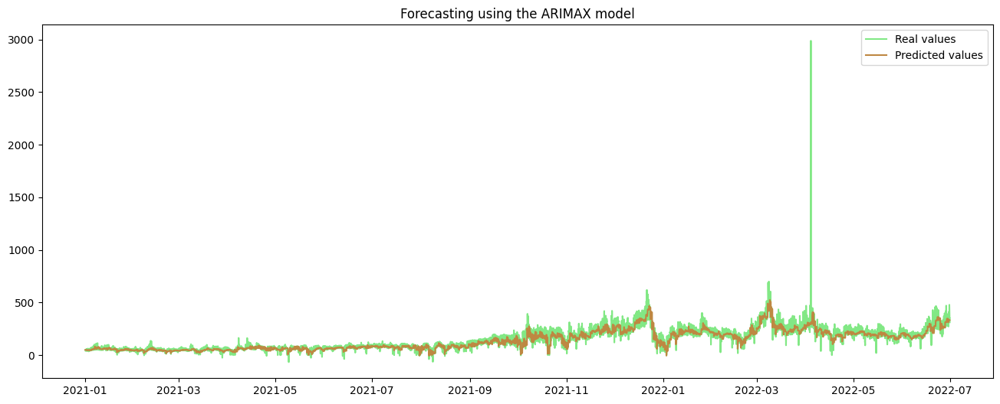

In [21]:
plt.figure(figsize=(16, 6))
plt.plot(FR_price_test, color='#82E885',label='Real values')
plt.plot(predictions_FR_arima, color='#BE8842', label='Predicted values')
plt.legend(loc='best')
plt.title('Forecasting using the ARIMAX model')
plt.show()

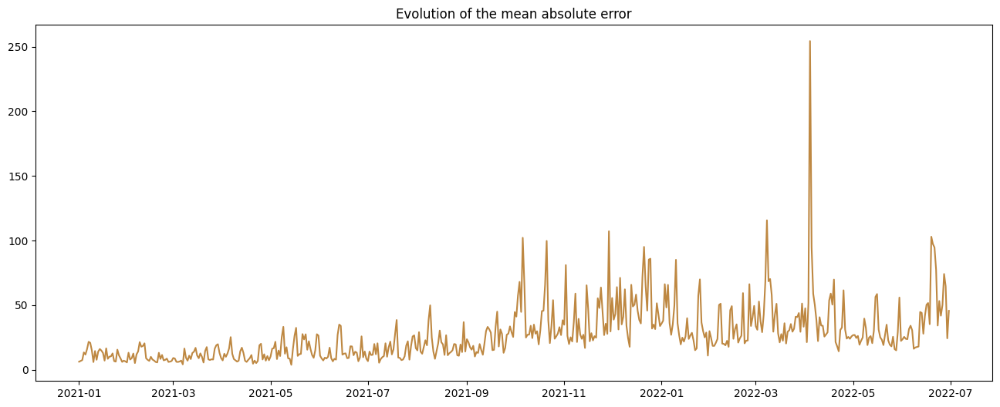

In [22]:
plt.figure(figsize=(16, 6))
plt.plot([time.date() for time in FR_price_test.index[::24]], MAE_FR_arima, color='#BE8842')
plt.title('Evolution of the mean absolute error')
plt.show()

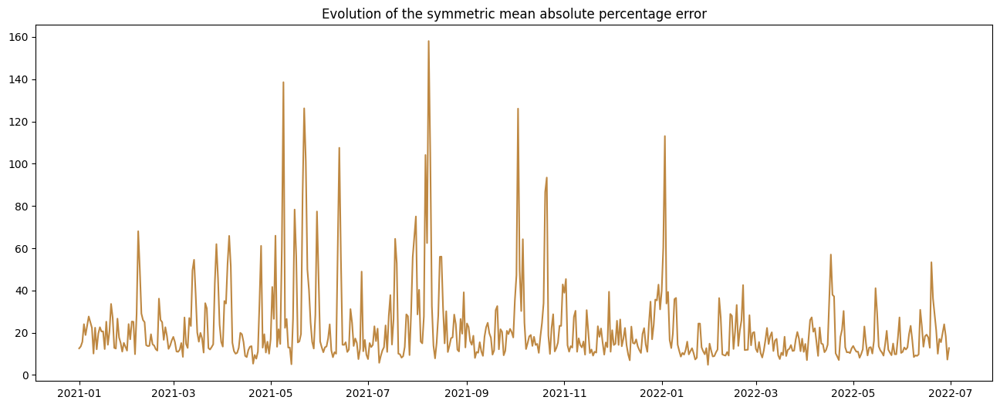

In [23]:
plt.figure(figsize=(16, 6))
plt.plot([time.date() for time in FR_price_test.index[::24]], SMAPE_FR_arima, color='#BE8842')
plt.title('Evolution of the symmetric mean absolute percentage error')
plt.show()

In [24]:
print("MAE =", mean_absolute_error(FR_price_test, predictions_FR_arima))
print("SMAPE = "+str(smape(FR_price_test, predictions_FR_arima))+" %")

MAE = 26.981432273729556
SMAPE = 22.285541789530765 %


##### SARIMA model :

SARIMA stands for Seasonal AutoRegressive Integrated Moving Average. It is an extension of ARIMA that can account for seasonal patterns in the data. It has four additional parameters: P, D, Q, and s. The P, D, and Q parameters are similar to the p, d, and q parameters, but they apply to the seasonal component of the data. The s parameter represents the length of the seasonal cycle.

We will use the SARIMAX model. The name SARIMAX comes as an extension of SARIMA. The X added to the end stands for “exogenous”.

In [25]:
predictions_FR_sarima = pd.Series(dtype='float64')
MAE_FR_sarima = []
SMAPE_FR_sarima = []

for i in np.arange(0, end_test - start_test+1, 24):
    
    X_train = df_FR.iloc[start_train+i:start_test+i, [0,1]]
    y_train = df_FR.iloc[start_train+i:start_test+i, 2]
    
    model_sarima_FR = auto_arima(y_train,
                            start_p = 1,
                            start_q = 1,
                            max_p = 3,
                            max_q = 3,
                            test = 'adf',
                            seasonal = True,
                            start_P = 0,
                            start_Q = 0,
                            max_P = 3,
                            max_Q = 3,
                            exogenous = X_train,
                            trace = False,
                            error_action = "ignore",
                            suppress_warnings = True)
    
    model_sarima_FR.fit(y_train, exogenous=X_train)
    
    X_test = df_FR.iloc[start_test+i:start_test+i+24, [0,1]]
    y_test = df_FR.iloc[start_test+i:start_test+i+24, 2]
    
    forecast = model_sarima_FR.predict(n_periods=len(y_test), exogenous=X_test)
    MAE = mean_absolute_error(y_test, forecast)
    SMAPE = smape(y_test, forecast)
    
    MAE_FR_sarima.append(MAE)
    SMAPE_FR_sarima.append(SMAPE)
    
    print(str(forecast.index[0].date())+" ➜ MAE = "+str(round(MAE,6))+" / SMAPE = "+str(round(SMAPE,6))+" %")
        
    predictions_FR_sarima = pd.concat([predictions_FR_sarima, forecast])

2021-01-01 ➜ MAE = 6.147156 / SMAPE = 12.597109 %
2021-01-02 ➜ MAE = 6.755248 / SMAPE = 13.515329 %
2021-01-03 ➜ MAE = 7.365239 / SMAPE = 15.673073 %
2021-01-04 ➜ MAE = 13.351287 / SMAPE = 24.053016 %
2021-01-05 ➜ MAE = 11.671414 / SMAPE = 18.921679 %
2021-01-06 ➜ MAE = 15.909021 / SMAPE = 23.231552 %
2021-01-07 ➜ MAE = 21.539105 / SMAPE = 27.691899 %
2021-01-08 ➜ MAE = 20.784524 / SMAPE = 25.072238 %
2021-01-09 ➜ MAE = 14.91978 / SMAPE = 22.330606 %
2021-01-10 ➜ MAE = 5.873465 / SMAPE = 10.146135 %
2021-01-11 ➜ MAE = 14.413207 / SMAPE = 22.377641 %
2021-01-12 ➜ MAE = 7.62542 / SMAPE = 12.161532 %
2021-01-13 ➜ MAE = 13.962591 / SMAPE = 19.59308 %
2021-01-14 ➜ MAE = 15.983149 / SMAPE = 22.619178 %
2021-01-15 ➜ MAE = 14.761525 / SMAPE = 20.595266 %
2021-01-16 ➜ MAE = 12.878664 / SMAPE = 20.648591 %
2021-01-17 ➜ MAE = 7.008366 / SMAPE = 12.279043 %
2021-01-18 ➜ MAE = 16.482232 / SMAPE = 25.246968 %
2021-01-19 ➜ MAE = 8.375346 / SMAPE = 14.311757 %
2021-01-20 ➜ MAE = 10.058931 / SMAPE = 20

2021-06-13 ➜ MAE = 35.875577 / SMAPE = 107.628612 %
2021-06-14 ➜ MAE = 33.889916 / SMAPE = 55.280974 %
2021-06-15 ➜ MAE = 15.932488 / SMAPE = 20.490766 %
2021-06-16 ➜ MAE = 14.74279 / SMAPE = 17.356716 %
2021-06-17 ➜ MAE = 10.608022 / SMAPE = 12.814963 %
2021-06-18 ➜ MAE = 9.959347 / SMAPE = 12.294422 %
2021-06-19 ➜ MAE = 8.013933 / SMAPE = 10.825679 %
2021-06-20 ➜ MAE = 16.187585 / SMAPE = 28.595967 %
2021-06-21 ➜ MAE = 18.327185 / SMAPE = 25.3734 %
2021-06-22 ➜ MAE = 14.537252 / SMAPE = 18.402244 %
2021-06-23 ➜ MAE = 12.223104 / SMAPE = 15.018919 %
2021-06-24 ➜ MAE = 13.338223 / SMAPE = 15.353998 %
2021-06-25 ➜ MAE = 7.668692 / SMAPE = 8.934606 %
2021-06-26 ➜ MAE = 9.369732 / SMAPE = 12.297499 %
2021-06-27 ➜ MAE = 25.22351 / SMAPE = 47.837886 %
2021-06-28 ➜ MAE = 23.737091 / SMAPE = 31.622937 %
2021-06-29 ➜ MAE = 13.761676 / SMAPE = 16.011506 %
2021-06-30 ➜ MAE = 10.573697 / SMAPE = 12.011396 %
2021-07-01 ➜ MAE = 9.057063 / SMAPE = 10.478987 %
2021-07-02 ➜ MAE = 14.111484 / SMAPE = 1

2021-11-22 ➜ MAE = 48.090639 / SMAPE = 19.720851 %
2021-11-23 ➜ MAE = 47.766623 / SMAPE = 18.064539 %
2021-11-24 ➜ MAE = 63.620585 / SMAPE = 22.004186 %
2021-11-25 ➜ MAE = 45.512984 / SMAPE = 15.350448 %
2021-11-26 ➜ MAE = 26.762899 / SMAPE = 9.656974 %
2021-11-27 ➜ MAE = 35.558456 / SMAPE = 15.413622 %
2021-11-28 ➜ MAE = 27.738336 / SMAPE = 13.143352 %
2021-11-29 ➜ MAE = 103.64753 / SMAPE = 37.777364 %
2021-11-30 ➜ MAE = 29.575847 / SMAPE = 11.006691 %
2021-12-01 ➜ MAE = 55.500029 / SMAPE = 21.197155 %
2021-12-02 ➜ MAE = 38.721629 / SMAPE = 14.19577 %
2021-12-03 ➜ MAE = 42.996679 / SMAPE = 14.75877 %
2021-12-04 ➜ MAE = 63.910171 / SMAPE = 25.672518 %
2021-12-05 ➜ MAE = 29.306873 / SMAPE = 13.42553 %
2021-12-06 ➜ MAE = 71.098438 / SMAPE = 26.288642 %
2021-12-07 ➜ MAE = 32.406371 / SMAPE = 12.556283 %
2021-12-08 ➜ MAE = 26.643193 / SMAPE = 10.962499 %
2021-12-09 ➜ MAE = 58.720336 / SMAPE = 20.875678 %
2021-12-10 ➜ MAE = 33.951305 / SMAPE = 14.13896 %
2021-12-11 ➜ MAE = 24.376531 / SMAPE

2022-05-03 ➜ MAE = 24.527752 / SMAPE = 11.016369 %
2022-05-04 ➜ MAE = 26.101045 / SMAPE = 11.051698 %
2022-05-05 ➜ MAE = 19.296547 / SMAPE = 8.169237 %
2022-05-06 ➜ MAE = 22.392101 / SMAPE = 9.89625 %
2022-05-07 ➜ MAE = 24.838533 / SMAPE = 12.136645 %
2022-05-08 ➜ MAE = 39.512673 / SMAPE = 22.954054 %
2022-05-09 ➜ MAE = 32.386453 / SMAPE = 15.070157 %
2022-05-10 ➜ MAE = 19.045045 / SMAPE = 9.261086 %
2022-05-11 ➜ MAE = 24.807357 / SMAPE = 12.952484 %
2022-05-12 ➜ MAE = 25.979691 / SMAPE = 13.183603 %
2022-05-13 ➜ MAE = 20.484114 / SMAPE = 10.146307 %
2022-05-14 ➜ MAE = 29.966053 / SMAPE = 16.182506 %
2022-05-15 ➜ MAE = 56.304905 / SMAPE = 41.087488 %
2022-05-16 ➜ MAE = 58.559556 / SMAPE = 29.202644 %
2022-05-17 ➜ MAE = 30.962649 / SMAPE = 13.550765 %
2022-05-18 ➜ MAE = 25.007713 / SMAPE = 11.661362 %
2022-05-19 ➜ MAE = 23.140726 / SMAPE = 10.669527 %
2022-05-20 ➜ MAE = 19.012391 / SMAPE = 9.162921 %
2022-05-21 ➜ MAE = 26.986427 / SMAPE = 14.49329 %
2022-05-22 ➜ MAE = 34.809577 / SMAPE 

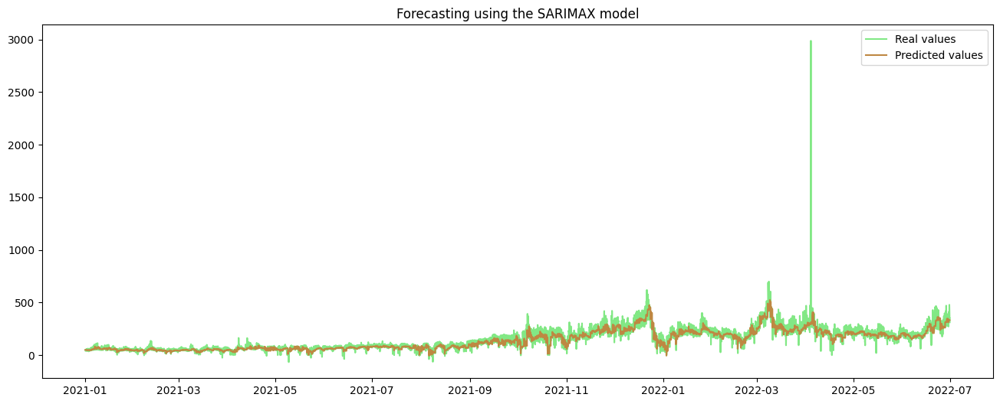

In [26]:
plt.figure(figsize=(16, 6))
plt.plot(FR_price_test, color='#82E885',label='Real values')
plt.plot(predictions_FR_sarima, color='#BE8842', label='Predicted values')
plt.legend(loc='best')
plt.title('Forecasting using the SARIMAX model')
plt.show()

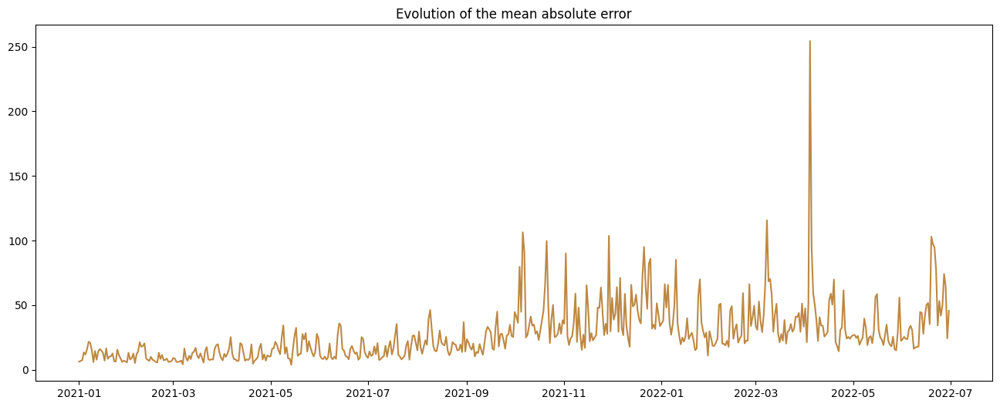

In [27]:
plt.figure(figsize=(16, 6))
plt.plot([time.date() for time in FR_price_test.index[::24]], MAE_FR_sarima, color='#BE8842')
plt.title('Evolution of the mean absolute error')
plt.show()

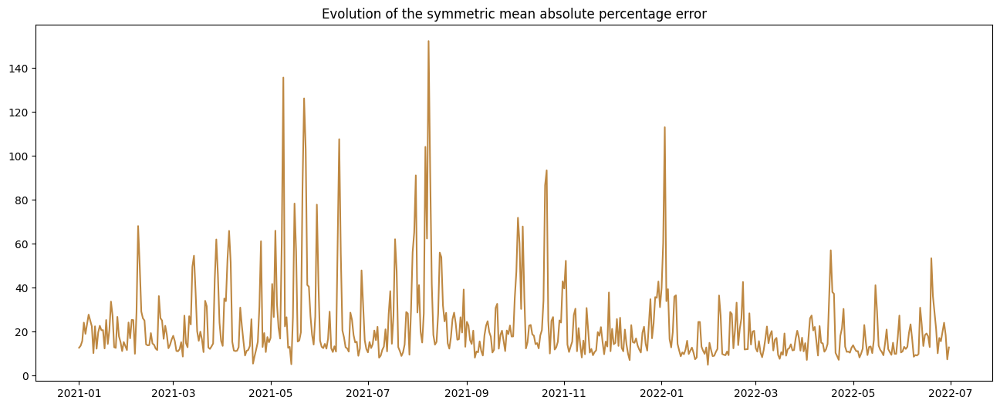

In [28]:
plt.figure(figsize=(16, 6))
plt.plot([time.date() for time in FR_price_test.index[::24]], SMAPE_FR_sarima, color='#BE8842')
plt.title('Evolution of the symmetric mean absolute percentage error')
plt.show()

In [29]:
print("MAE =", mean_absolute_error(FR_price_test, predictions_FR_sarima))
print("SMAPE = "+str(smape(FR_price_test, predictions_FR_sarima))+" %")

MAE = 27.27922491649387
SMAPE = 22.528376766958132 %
